In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [154]:
df=pd.read_csv('data/energydata.csv')

In [4]:
profile = ProfileReport(df, title='MPG Pandas Profiling Report', explorative = True)

In [5]:
profile

In [6]:
profile.to_file('energydata_profiling_report.pdf')

C:\Users\Admin\AppData\Roaming\Python\Python37\site-packages\pandas_profiling\profile_report.py:251: UserWarning: Extension .pdf not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  f"Extension {suffix} not supported. For now we assume .html was intended. "


In [37]:
import warnings
warnings.filterwarnings("ignore")

# Data cleaning
1. Data cleaning(numeric,strings..)
3. removing more missing values data
4. Categorical and Numerical data analysis

In [155]:
df.replace('Not Available',np.nan,inplace=True)


In [156]:
pd.set_option('display.max_columns',None)
df.head(2)

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,NaN,10017,675,3 AVENUE,Manhattan,289356.0,Office,Office,Office,293447,NaN,NaN,NaN,NaN,1963,2,100,Whole Building,NaN,NaN,305.6,303.1,37.8,NaN,614.2,NaN,NaN,NaN,NaN,NaN,5.15506751E7,NaN,NaN,38139374.2,1.10827705E7,6962.2,0,6962.2,762051,NaN,NaN,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.750791,-73.973963,6.0,4.0,88.0,Turtle Bay-East Midtown ...
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,NaN,10032,180,FT WASHINGTON AVENUE,Manhattan,3693539.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,NaN,NaN,NaN,NaN,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,NaN,1.96248472E7,NaN,NaN,NaN,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,NaN,NaN,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841402,-73.942568,12.0,10.0,251.0,Washington Heights South ...


In [157]:
df.dtypes

Order                                                           int64
Property Id                                                     int64
Property Name                                                  object
Parent Property Id                                             object
Parent Property Name                                           object
BBL - 10 digits                                                object
NYC Borough, Block and Lot (BBL) self-reported                 object
NYC Building Identification Number (BIN)                       object
Address 1 (self-reported)                                      object
Address 2                                                      object
Postal Code                                                    object
Street Number                                                  object
Street Name                                                    object
Borough                                                        object
DOF Gross Floor Area

In [160]:
obj_cols=df.select_dtypes('object').columns

In [319]:
df.select_dtypes('object').head(2)

,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,2nd Largest Property Use Type,3rd Largest Property Use Type,Metered Areas (Energy),Metered Areas (Water),Release Date,Water Required?,DOF Benchmarking Submission Status,NTA
0,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,NaN,10017,675,3 AVENUE,Manhattan,Office,Office,Office,NaN,NaN,Whole Building,NaN,05/01/2017 05:32:03 PM,No,In Compliance,Turtle Bay-East Midtown
1,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,NaN,10032,180,FT WASHINGTON AVENUE,Manhattan,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),NaN,NaN,Whole Building,Whole Building,04/27/2017 11:23:27 AM,No,In Compliance,Washington Heights South


In [70]:
#from pandas.core.common import flatten
#r=print(*range(22,43),sep=(','))

In [164]:
l=[[15,17,19],[x for x in range(22,44)]]

li=np.concatenate(l)

In [165]:
obj_cols[li]

Index(['Largest Property Use Type - Gross Floor Area (ft²)',
       '2nd Largest Property Use - Gross Floor Area (ft²)',
       '3rd Largest Property Use Type - Gross Floor Area (ft²)',
       'ENERGY STAR Score', 'Site EUI (kBtu/ft²)',
       'Weather Normalized Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Source EUI (kBtu/ft²)', 'Fuel Oil #1 Use (kBtu)',
       'Fuel Oil #2 Use (kBtu)', 'Fuel Oil #4 Use (kBtu)',
       'Fuel Oil #5 & 6 Use (kBtu)', 'Diesel #2 Use (kBtu)',
       'District Steam Use (kBtu)', 'Natural Gas Use (kBtu)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Electricity Use - Grid Purchase (kBtu)',
       'Weather Normalized Site Electricity (kWh)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Direct GHG Emissions (Metric Tons CO2e)',
       'Indirect GHG Emissions (Metric Tons CO2e)',
       'W

In [166]:
for x in obj_cols[li]:
    
    df[x]=pd.to_numeric(df[x])

In [262]:
df['NTA']=df[['NTA']].applymap(lambda x: str(x).strip())

In [167]:
df_missing_info=pd.DataFrame(df.isnull().sum()).rename(columns={0:'no_of_missing_values'}).sort_values(by='no_of_missing_values',ascending=False)

In [168]:
df_missing_info['missing_values%']=df_missing_info['no_of_missing_values'].apply(lambda x:x/len(df))

In [320]:
final_df=df.drop(columns=list(df_missing_info[(df_missing_info['missing_values%']>0.5)].index))

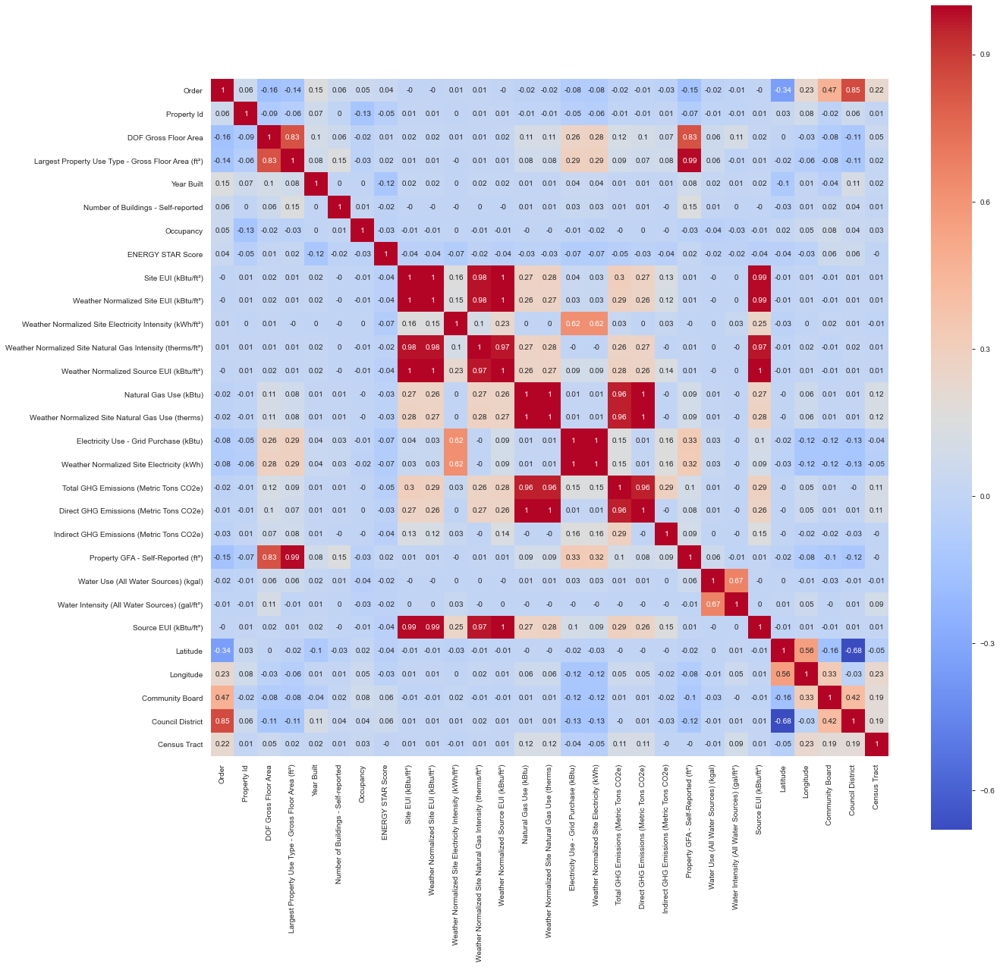

In [323]:
plt.figure(figsize=(20, 20))
sns.heatmap(round(final_df.corr(), 2), annot=True, square=True, cmap='coolwarm')
plt.show()

In [321]:
final_df.dtypes

Order                                                           int64
Property Id                                                     int64
Property Name                                                  object
Parent Property Id                                             object
Parent Property Name                                           object
BBL - 10 digits                                                object
NYC Borough, Block and Lot (BBL) self-reported                 object
NYC Building Identification Number (BIN)                       object
Address 1 (self-reported)                                      object
Postal Code                                                    object
Street Number                                                  object
Street Name                                                    object
Borough                                                        object
DOF Gross Floor Area                                          float64
Primary Property Typ

# categorical data analysis

In [324]:
cat_cols=final_df.select_dtypes(include=object).columns
cat_cols

Index(['Property Name', 'Parent Property Id', 'Parent Property Name',
       'BBL - 10 digits', 'NYC Borough, Block and Lot (BBL) self-reported',
       'NYC Building Identification Number (BIN)', 'Address 1 (self-reported)',
       'Postal Code', 'Street Number', 'Street Name', 'Borough',
       'Primary Property Type - Self Selected',
       'List of All Property Use Types at Property',
       'Largest Property Use Type', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'Release Date', 'Water Required?',
       'DOF Benchmarking Submission Status', 'NTA'],
      dtype='object')

energy score vs borough 

Text(0.5, 1.0, 'ENERGY STAR Score with respect to Borough')

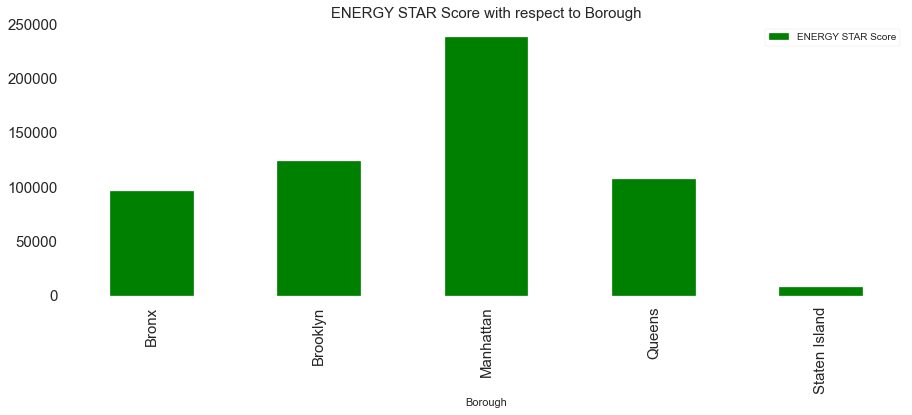

In [20]:

bo_energy = final_df[['Borough','ENERGY STAR Score']].groupby(['Borough']).sum()
bo_energy.plot(kind='bar',figsize=(15,5), fontsize=15,color='green').set_title('ENERGY STAR Score with respect to Borough',fontsize=15)

In [325]:
im_bor = final_df[['Borough','ENERGY STAR Score']].groupby(['Borough']).sum()\
.sort_values(by='ENERGY STAR Score',ascending=False).reset_index()['Borough'].tolist()[:4]
im_bor

['Manhattan', 'Brooklyn', 'Queens', 'Bronx']

energy score vs property type

Text(0.5, 1.0, 'ENERGY STAR Score with respect to Largest Property Use Type')

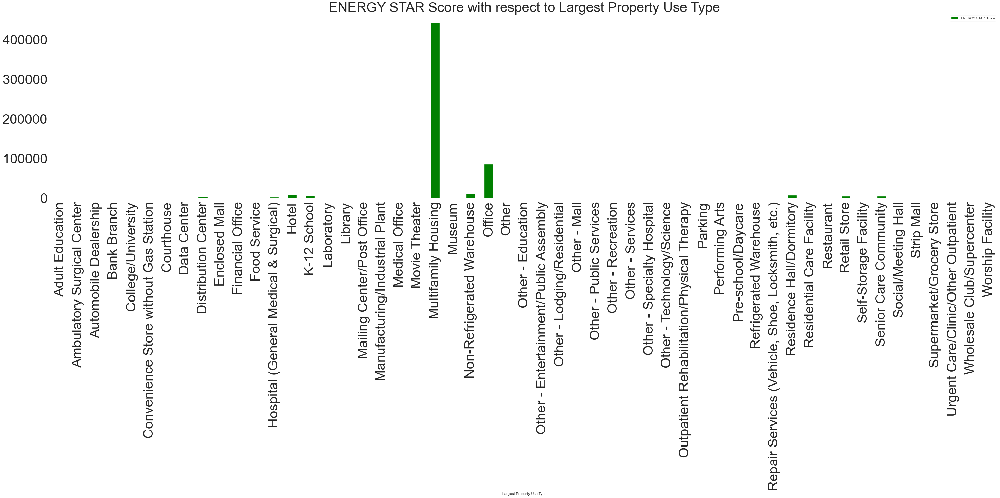

In [21]:

pro_energy = final_df[['Largest Property Use Type','ENERGY STAR Score']].groupby(['Largest Property Use Type']).sum()
pro_energy.plot(kind='bar',figsize=(50,10), fontsize=40,color='green').set_title('ENERGY STAR Score with respect to Largest Property Use Type',fontsize=40)

here most of the property types are not showing impact on our target,so lets see what are the important property types

In [265]:
im_prop=final_df.groupby(['Largest Property Use Type'])['ENERGY STAR Score'].sum().reset_index()\
    .sort_values(by='ENERGY STAR Score',ascending=False).reset_index(drop=True)['Largest Property Use Type'].tolist()[:4]

In [266]:
im_prop

['Multifamily Housing', 'Office', 'Non-Refrigerated Warehouse', 'Hotel']

In [189]:
import plotly.express as px
f=final_df[(final_df['Largest Property Use Type']).isin(im_prop)]
fig = px.box(f[['Largest Property Use Type','ENERGY STAR Score']],x='Largest Property Use Type', y='ENERGY STAR Score')
fig.show()

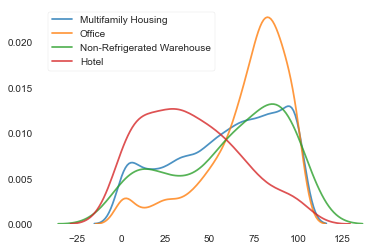

In [190]:
for p in im_prop:   
    sns.kdeplot(final_df[final_df['Largest Property Use Type'] == p]['ENERGY STAR Score'].dropna(),
    label = b_type, shade = False, alpha = 0.8)

there are no much outliers and also these top 4 important properties showing impact on the target and can be included by doing one hot encoding in model

energy score vs NTA 

data cleaning:
-removing extra space in the NTA values

Text(0.5, 1.0, 'ENERGY STAR Score with respect to NTA')

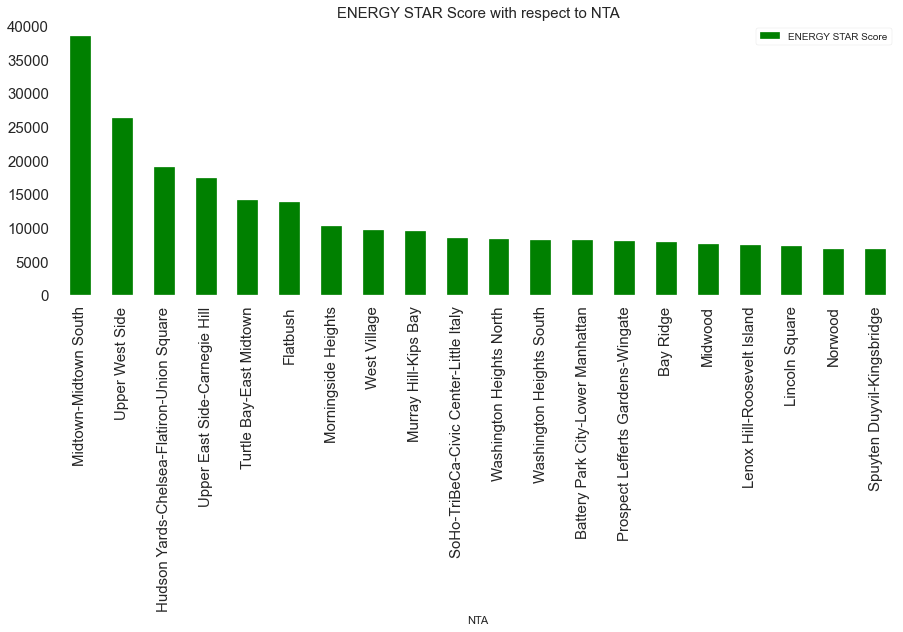

In [228]:

NTA_energy = final_df[final_df['NTA']!='nan'][['NTA','ENERGY STAR Score']].groupby(['NTA']).sum().sort_values(by='ENERGY STAR Score',ascending=False)[:20]
NTA_energy.plot(kind='bar',figsize=(15,5), fontsize=15,color='green').set_title('ENERGY STAR Score with respect to NTA',fontsize=15)

In [347]:
im_nta=NTA_energy = final_df[final_df['NTA']!='nan'][['NTA','ENERGY STAR Score']].groupby(['NTA']).sum().sort_values(by='ENERGY STAR Score',ascending=False).reset_index()['NTA'].tolist()[:4]
im_nta

['Midtown-Midtown South',
 'Upper West Side',
 'Hudson Yards-Chelsea-Flatiron-Union Square',
 'Upper East Side-Carnegie Hill']

from the above plot we can say that top 4 are showing impact on the target

# Numeric data analysis

In [326]:
num_cols=final_df.select_dtypes(exclude=object).columns

In [327]:
num_cols

Index(['Order', 'Property Id', 'DOF Gross Floor Area',
       'Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built',
       'Number of Buildings - Self-reported', 'Occupancy', 'ENERGY STAR Score',
       'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Source EUI (kBtu/ft²)', 'Natural Gas Use (kBtu)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Electricity Use - Grid Purchase (kBtu)',
       'Weather Normalized Site Electricity (kWh)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Direct GHG Emissions (Metric Tons CO2e)',
       'Indirect GHG Emissions (Metric Tons CO2e)',
       'Property GFA - Self-Reported (ft²)',
       'Water Use (All Water Sources) (kgal)',
       'Water Intensity (All Water Sources) (gal/ft²)',
       'Source EUI (kBtu/ft²)', 'Latitude', 'Lo

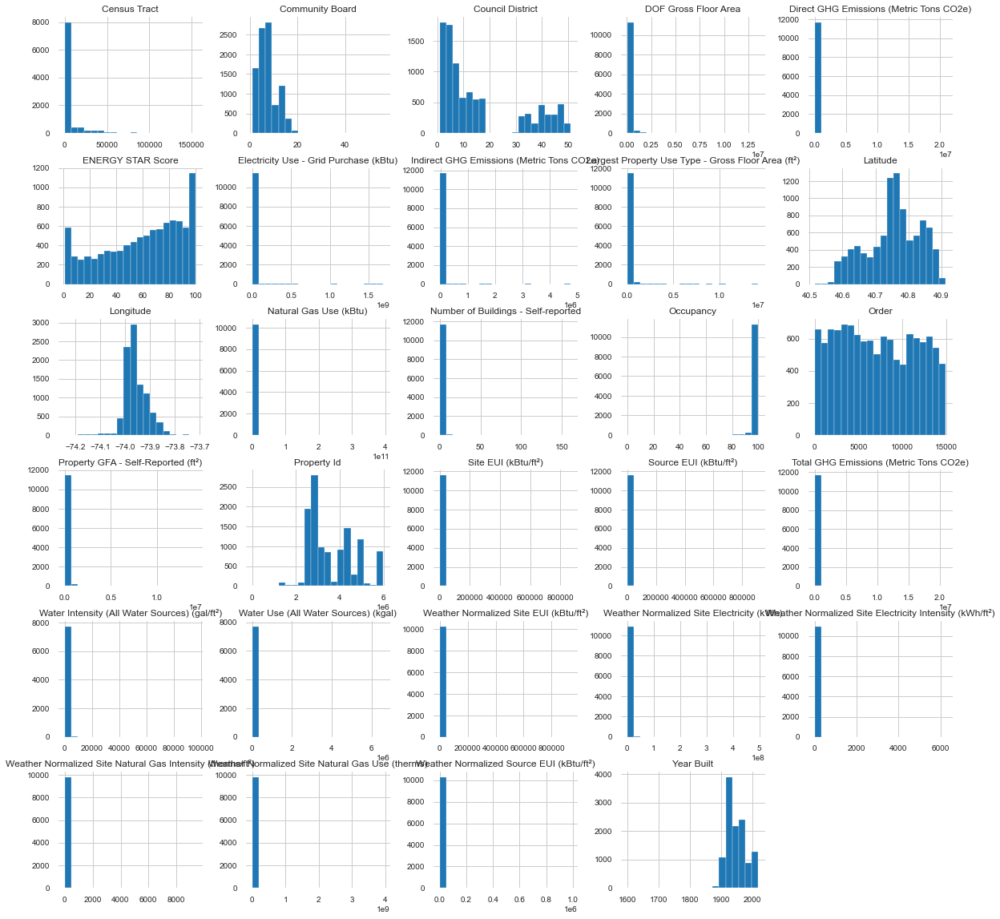

In [328]:
final_df[num_cols].hist(figsize=[20,20], bins=20)
plt.show()

In [45]:
#final_df['Natural Gas Use (kBtu)'].dropna().sort_values().tail(10)

Here we can see some column values are right skewed may be because of presence of high scores for few buildings which we noticed in property type bar graph

# Removing outliers

In [329]:
class outlier():
    def __init__(self, df,n, column):
        self.df = df
        self.n=n
        self.column = column
    def cal(self):
        
        q1 = self.df[self.column].quantile(0.25)
        q3 = self.df[self.column].quantile(0.75)
        iqr = q3-q1 
        #print('iqr is',iqr)
        low  = q1-self.n*iqr
        high = q3+self.n*iqr
        #print(low)
        #print(high)
        return low,high
    def defineoutlier(self,x):
        if x < self.cal()[0] or x> self.cal()[1]:
            return 'yes'
        else:
            return 'no'
    def outlierdf(self):
        #self.df['outlier']=self.df[self.column].apply(lambda x:self.defineoutlier(x))
        return self.df[(self.df[self.column] > self.cal()[0]) &(self.df[self.column] < self.cal()[1])]

In [330]:
newdf=outlier(final_df,3,'Site EUI (kBtu/ft²)').outlierdf()

In [345]:
most_imp_features=abs(newdf.corr()['ENERGY STAR Score'])
most_imp_features[most_imp_features>0.6]

ENERGY STAR Score                           1.000000
Site EUI (kBtu/ft²)                         0.723864
Weather Normalized Site EUI (kBtu/ft²)      0.713993
Weather Normalized Source EUI (kBtu/ft²)    0.645542
Source EUI (kBtu/ft²)                       0.641037
Name: ENERGY STAR Score, dtype: float64

we can observe here after removing outliers site EUI impacts more on our target

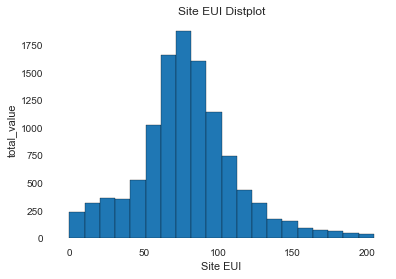

In [331]:
plt.hist(newdf['Site EUI (kBtu/ft²)'].dropna(), bins = 20, edgecolor = 'black');
plt.xlabel('Site EUI'); 
plt.ylabel('total_value'); plt.title('Site EUI Distplot');

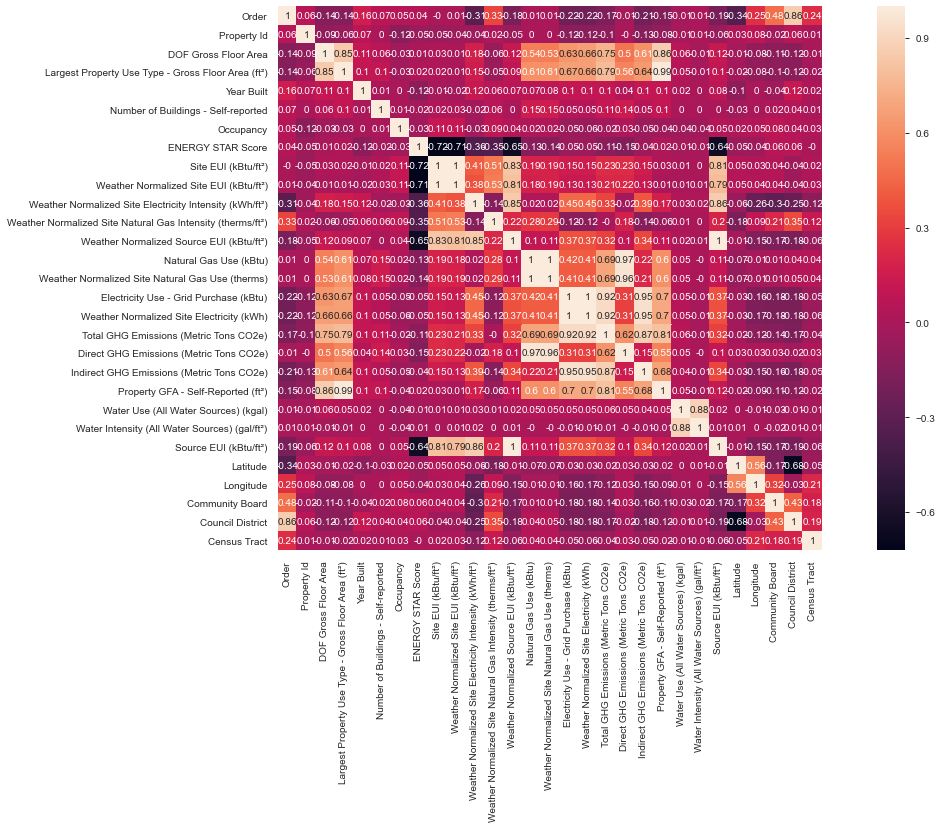

In [332]:
plt.figure(figsize=(20, 10))
sns.heatmap(round(newdf.corr(), 2), annot=True, square=True)
plt.show()

from the correlation plot,we can notice here that our target has high negative correlation values and lets see for all variables also

for i in newdf.corr().columns:
    j=newdf.corr()[i].values.tolist()
    j2 = sorted(x for x in j if x < 0)
    print('{} has {} negatively correlated values'.format(i,len(j2)))

here after removing outliers,our target variable has higher impact with higher number of negatively correlated values,so we can notice that there is some non linear relationship that is as our target decreases with increase in other feature values and shall apply log transformation

In [333]:
(newdf.shape)

(11319, 49)

In [335]:
newdf.to_csv('preprocessed_data.csv',index=False)